<style>
  h1 {
    color: Navy !important;
  }
  h2 {
    color: Seagreen !important;
  }
  h3 {
    color: Maroon !important;
  }
</style>

# Data-driven approaches to understanding dementia
## Application of single cell analysis to dementia research: practical
### Mark Fiers & Emma Davis

## Goals

* Understand a single cell data analysis workflow
* Practically run a basic single cell workflow
* Understand where things can go wrong (and how to catch problems)
* Pointers on where to continue your analysis

## Outline 

- Introduction
- Finding & loading data
- Preprocessing & QA
- Dimensionality reduction & clustering
- Differential expression, finding marker genes
- Continuing the analysis
- Closing remarks

## Trust, But verify.

*- or - a reflection on data analysis & bioinformatics*

* Treat all operations as 'black box'.
* Understand and check input & output.
* Once you have a result, confirm using raw data. For example, you have gene X upregulated in elder microglia - go back to the raw counts, and independently check it is the case.
* Understand the biology & published literature - be wary of results that contradict what you expect.


## Experimental setup

How your experiment was performed, and how it compares to your expectations and/or literature depends on how the experiment was performed.

| | | | |
|-|-|-|-|
| **General**     | [Power analysis ](https://www.nature.com/articles/s41467-021-26779-7)  | Randomization | Controls |
| **Samples**     | Selection           | Matched samples   | Post mortem delay     | 
| **Preparation** | Cells or nuclei     | FACS Sorted? | Library prep protocol |
| **Sequencing**  | Sequencing platform | Depth        | |


## Importance of experimental setup

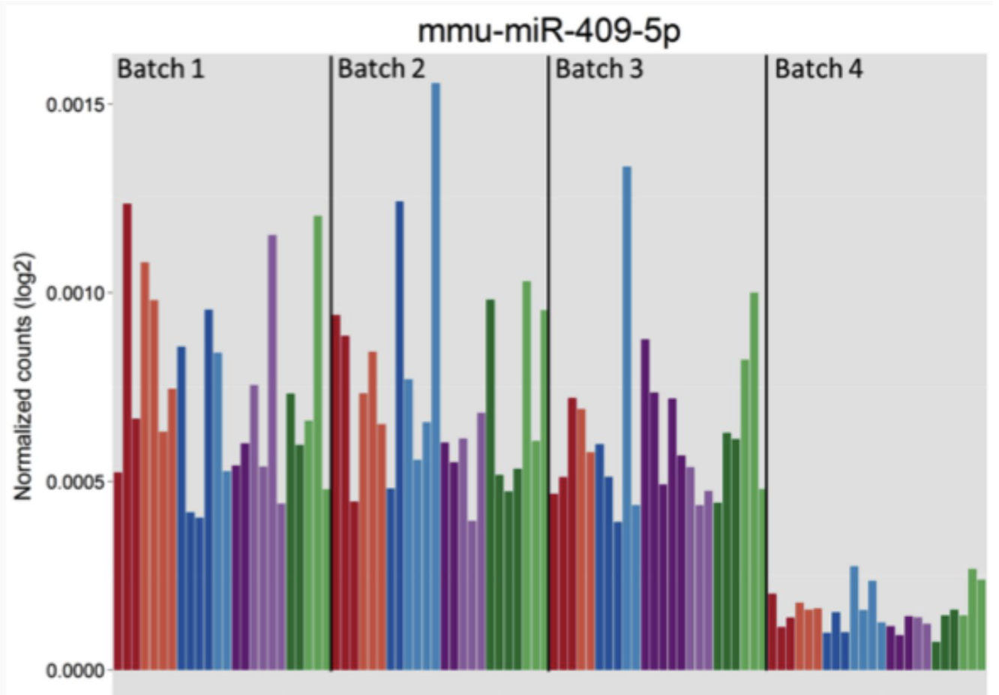

## How to get help?

- Tutorials (eg, [Scanpy tutorials](https://scanpy-tutorials.readthedocs.io/en/latest/))
- Your friendly neighbourhood bioinformatician
- chatGPT & friends
- Google
- Read API documentation (describing the functions in a package (eg, [Scanpy API](https://scanpy.readthedocs.io/en/latest/api/index.html))
- Fiddle around

---

# Technicalities

## Conda / Mamba

We are running in a conda environment. Conda is a software package manager - allows you to maintain a consistent and reproducible software environment. Mamba is it's interchangeable, but faster sister. [Read more on the Mamba documentation page](https://mamba.readthedocs.io/)

### Recreate this conda/mamba environment

```
# or mamba install
conda install -c conda-forge scanpy python-igraph leidenalg \
    jupyterlab seaborn scikit-learn statsmodels colorcet \
    scipy matplotlib jupyterlab jupyter_contrib_nbextensions \
    pooch
```

## Jupyter

Jupyter is a digital notebook to organize code, documentation and visualizations. Jupyter allows you to:

- Organize a data analysis workflow
- Share your workflow (the `.ipynb` notebook) with others
- Document your code and results in one document (literate programming)
- Repeat an analysis

## Start our session

### First - go to your VM and open a terminal:

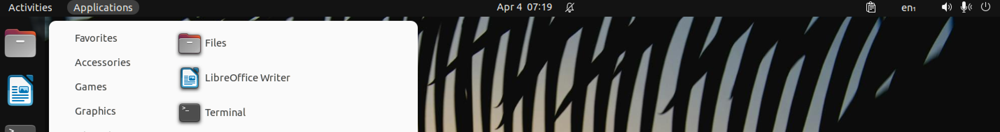

### Startup the environment

```
cd MF_SingleCell                 # Go to our work folder
./download_notebook.sh           # Download the ipython notebook
conda activate MF_SingleCell     # Start the conda environment
jupyter lab                      # Start jupyter lab
```

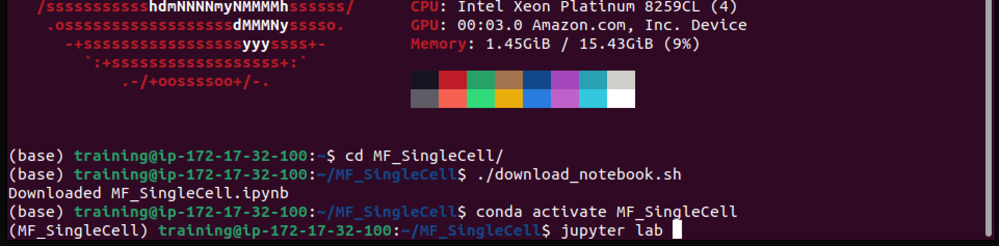

### Jupyter lab initial interface

*Maybe you need to click the `MF_SingleCell.ipynb` link on the left*

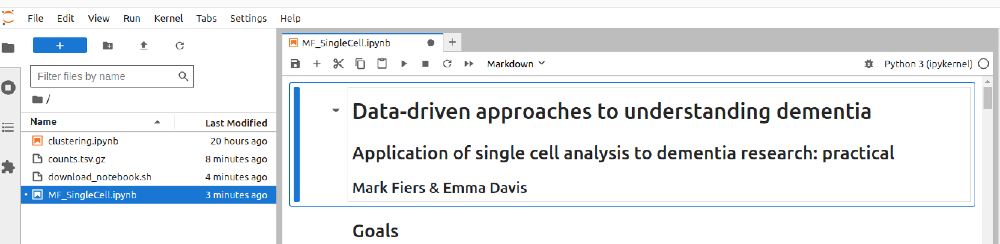

## Import modules

We'll need to tell python what libraries we are going to use

## <span style="color:crimson">🏃 Exercise:</span> Execute this cell.

In [24]:
import scanpy as sc              # Single cell analysis toolkit
import pandas as pd              # Sort of Excel on steroids (in Python)
import matplotlib.pyplot as plt  # Plotting library
import seaborn as sns            # Pretty plots

---

# Scanpy

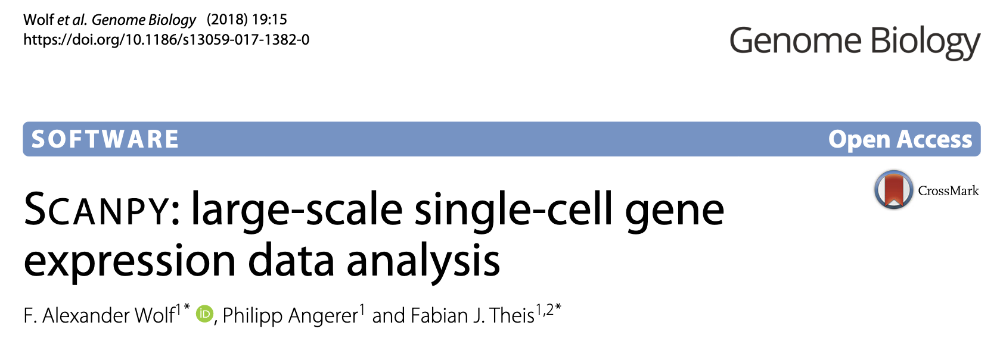

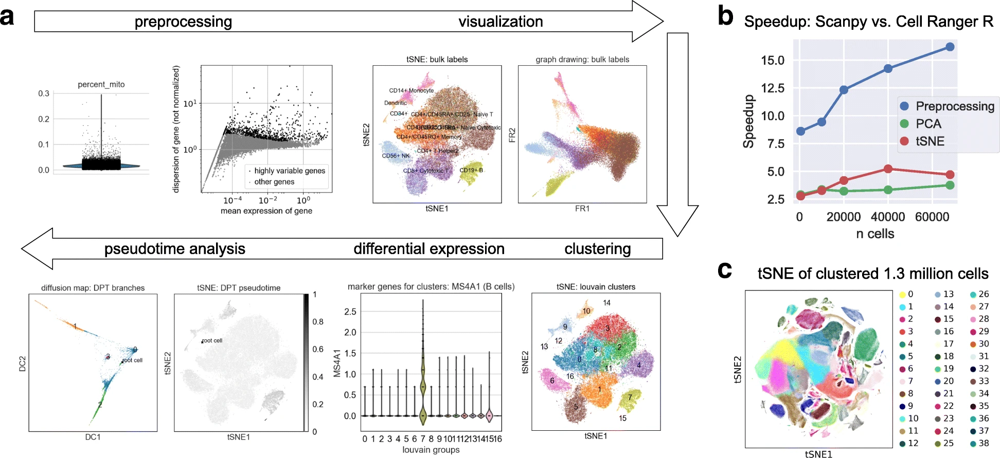

### A Simple Workflow

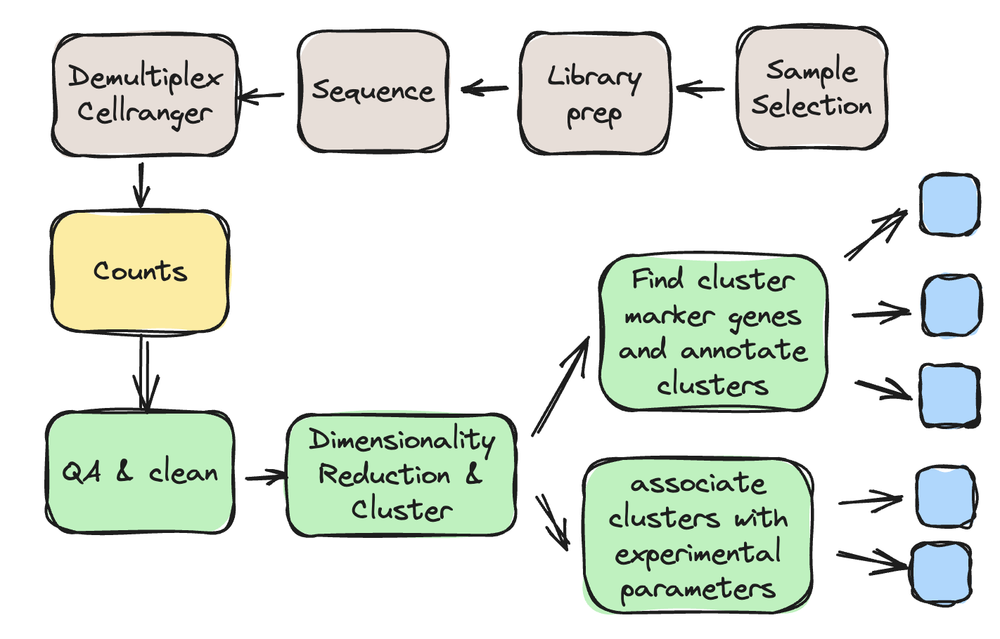

## Scanpy vs R/Seurat?

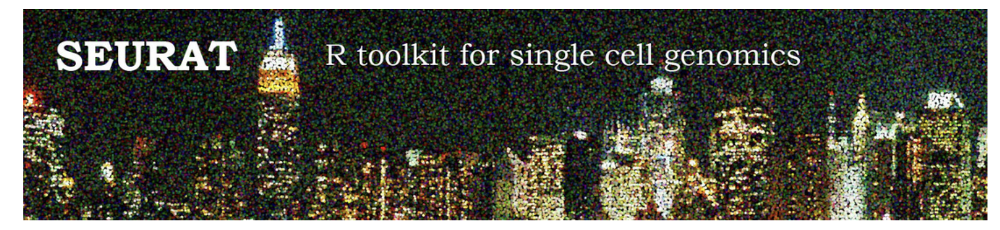

* Both very capable frameworks
* Python vs R & their ecosystems
* R/Seurat is better for advanced statistics, **differential expression** analysis

---

# Data-set
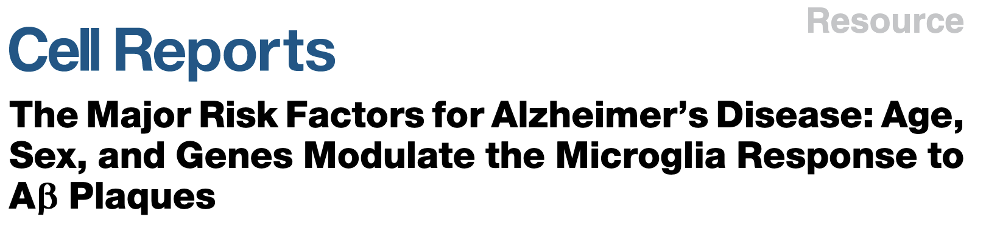


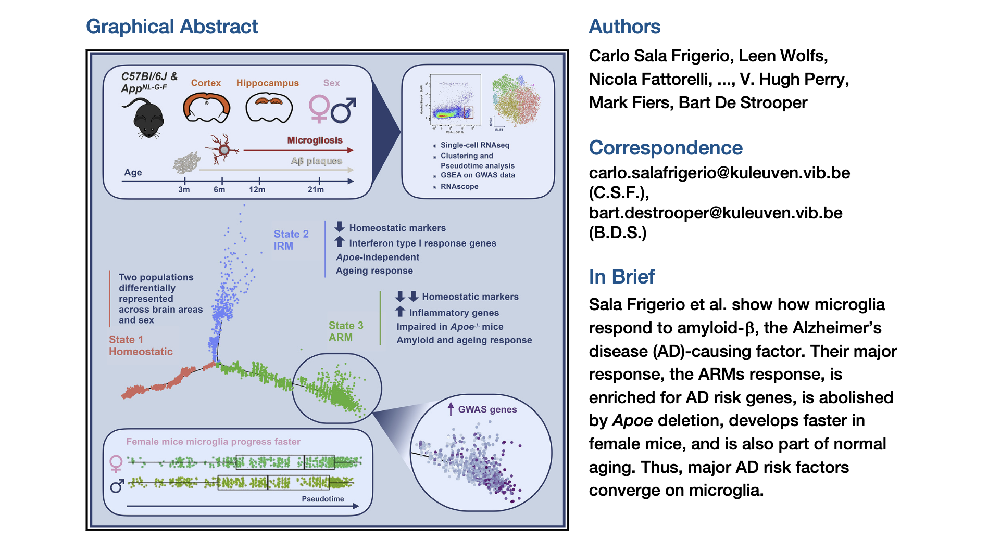

---

# Finding & loading data

A **raw count** matrix & **cell metadata** table are provided as `counts.tsv.gz` and `metadata.tsv.gz`. There are gzipped (compressed) tab-separated text files.

In [81]:
# trick in a jupyter notebook - any line starting with a ! executes as a bash/shell command
!ls -lh counts.tsv.gz metadata.tsv.gz

-rw-r--r--@ 1 u0089478  1547395761    61M Apr  3 14:47 counts.tsv.gz
-rw-r--r--@ 1 u0089478  1547395761    33K Apr  3 21:51 metadata.tsv.gz


## Metadata.

The experiment compares microglia from mice multiple ages (3, 6, 12 and 21 months); from male and female mice; from hippocampus and cortex; and from wild-type mice and APP-NLGF AD model mice. The metadata fields are encoded as:

| Field          |                  |                    |
|:---------------|:-----------------|:-------------------|
| **sex (gender)**     | **F**: Female    | **M**: Male        |
| **genotypep**  | **K**: APP-NLGF  | **W**: Wild type   |
| **tissue**     | **C**: Cortex    | **H**: Hippocampus |
| **plate**      | Plate the cell was capture in        ||
| **lane**       | Sequencing run                       ||

## Load the data

In [156]:
# load raw counts using pandas' `read_csv` function
counts = pd.read_csv('counts.tsv.gz', sep="\t", index_col=0)
counts.shape    # determine how big the table is - 10801 cells x 29474 genes

(10801, 29474)

In [157]:
# load metadata
metadata = pd.read_csv('metadata.tsv.gz', sep="\t", index_col=0)
# rename gender to sex
metadata = metadata.rename(columns=dict(gender='sex'))
metadata.shape   # metadata, 10801 cells again - same as the count table and 6 columns

(10801, 6)

## Inspect your data!

### Count table

Very important - never blindly rely on data being what you think it is.

Note, cells are in rows, genes as columns. This is how Scanpy needs it later on.

In [158]:
counts.iloc[:5,:5]

,-343C11.2,00R_AC107638.2,0610005C13Rik,0610006L08Rik,0610007P14Rik
K03FC.1A10,0,0,0,0,0
K03FC.3A6,0,0,0,0,0
K03FH.3B1,0,0,0,0,0
K03FH.3E3,0,0,0,0,0
K03FH.4A11,0,0,0,0,0


This is an awful lot of zero's. A cell can be zero if a gene does not express in that cell - or - if for whatever reason the gene is not picked up. Single cell transcriptomics, compared to bulk transcriptomics has to work with very little RNA - and hence - it's sensitivity is much lower. In this dataset ~93% is zero, which is not abnormal and explains the large number of zero's in the snippet above (in bulk RNAseq I would expect that to be well below 50%)

Let's find some gene * cells that do show expression. First, which genes express highly overall?

In [159]:
# note the power of pandas by chaining operations:
# first we sum per gene, 
#    then sort descendingly, 
#    and show the 'head'
counts.sum().sort_values(ascending=False).head()

Rn18s-rs5    269069792
Cst3         257752441
Hexb          92712398
Ctss          82061674
Cx3cr1        77511440
dtype: int64

Then we can check the values of a few genes across all cells - we have a much better chance to see genes express now.

It usually pays off to have a few *favourite* genes to follow throughout your analysis. Helps to keep a global view. I'm adding "Apoe".

In [160]:
counts[ ['Cst3', 'Hexb', 'Ctss', 'Apoe'] ].head()

,Cst3,Hexb,Ctss,Apoe
K03FC.1A10,6630,2134,3327,1
K03FC.3A6,7155,74,1131,0
K03FH.3B1,4601,2459,2507,0
K03FH.3E3,853,589,552,0
K03FH.4A11,3944,1426,1701,0


Note, these are all integers - as you would expect dealing with raw counts! 

### It is also easy to create a density plot to see the expression of a gene

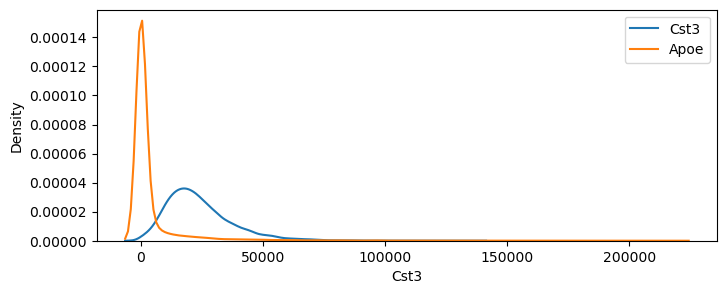

In [161]:
plt.figure(figsize=(8,3))
sns.kdeplot(counts['Cst3'], label='Cst3')
sns.kdeplot(counts['Apoe'], label='Apoe')
plt.legend();

### <span style="color:crimson"> Exercise:</span> Create a scatterplot of the expression of Cst3 vs Apoe.

If you don't know how to do this, try google or chatGPT.

## Same for metadata

In [162]:
metadata.head()

,age,sex,genotype,tissue,plate,lane
K03FC.1A10,3,F,K,C,1,mglia25
K03FC.3A6,3,F,K,C,3,mglia26
K03FH.3B1,3,F,K,H,3,mglia28
K03FH.3E3,3,F,K,H,3,mglia28
K03FH.4A11,3,F,K,H,4,mglia28


### We can now create plots to see how many cells we have in each age group?

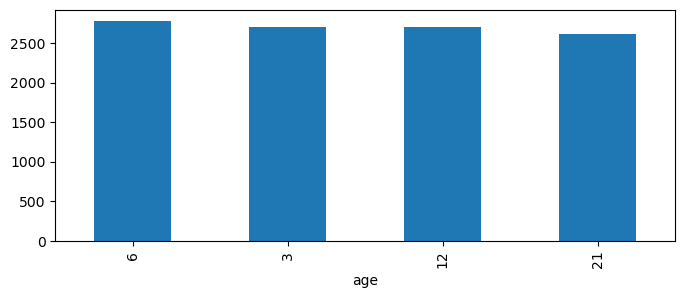

In [163]:
# Many roads lead to Rome - there are a number of ways in which this plot could have been made..
plt.figure(figsize=(8,3))
metadata['age'].value_counts().plot.bar();

## Pivot tables

Another important check is to see if your cells are balanced across experimental conditions. It may make certain comparisons difficult otherwise.

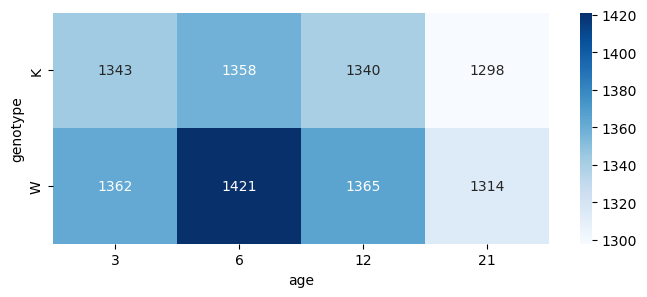

In [164]:
# More advanced, most of the magic is in pandas.
plt.figure(figsize=(8,3))
pivot = metadata.pivot_table(columns='age', index='genotype', 
                             values='plate', aggfunc=len)
sns.heatmap(pivot, annot=True, cmap='Blues', fmt='d');

### <span style="color:crimson">🏃 Exercise:</span> Create barplots for the distribution of genotype and sex

---

# Preprocessing & QC

Time to move to Scanpy. We are in broad strokes following [this tutorial](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html). For a number of steps, I verbatim copy bits from this tutorial (those will be marked by a "[<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html)" link to the relevant section.

## Create a scanpy object
First we create a scanpy object.

In [165]:
adata = sc.AnnData(counts, obs=metadata)

# last line in a cell gets printed. 
# Printing adata shows what it knows:
#    10801 cells (obs), 
#    ~29k genes (vars) 
#    and a number of metadata fields per cell (obs).
adata     

AnnData object with n_obs × n_vars = 10801 × 29474
    obs: 'age', 'sex', 'genotype', 'tissue', 'plate', 'lane'

## AnnData structure

Main attributes are:
- `adata.X` is a matrix with the counts
- `adata.obs` contains the per cell metadata.
- `adata.var` contains per gene metadata

In [168]:
# adata.X is a `numpy array`
adata.X[:3,:10]

array([[ 0,  0,  0,  0,  0,  0,  0,  0, 13,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0]])

In [170]:
#adata obs is a regular pandas object - we see our metadata again
adata.obs.head(3)

,age,sex,genotype,tissue,plate,lane
K03FC.1A10,3,F,K,C,1,mglia25
K03FC.3A6,3,F,K,C,3,mglia26
K03FH.3B1,3,F,K,H,3,mglia28


## Calculate QC stats in Scanpy

[<span style="color:green">[From the tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#quality-control): 

> The scanpy function `~scanpy.pp.calculate_qc_metrics` calculates common quality control (QC) metrics, which are largely based on `calculateQCMetrics` from scater `McCarthy2017`.

In [171]:
# convert the var names (gene names) to upper string - to make sure this works with 
# both mouse and human
adata.var["mt"] = adata.var_names.str.upper().str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.upper().str.startswith(("RPS", "RPL"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo"], inplace=True, log1p=True )

## Scanpy QC plots

We can now inspect violin plots to see the distribution of a number of quality parameters. These plots are important to understand the quality of the data, and you can use them for an initial filtering step. However, be careful in filtering too quickly.

From the [<span style="color:green">[Scanpy tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#quality-control): 

> Based on the QC metric plots, one could now remove cells that have too many mitochondrial genes expressed or too many total counts by setting manual or automatic thresholds. However, sometimes what appears to be poor QC metrics can be driven by real biology so we suggest starting with a very permissive filtering strategy and revisiting it at a later point. We therefore now only filter cells with less than 100 genes expressed and genes that are detected in less than 3 cells.


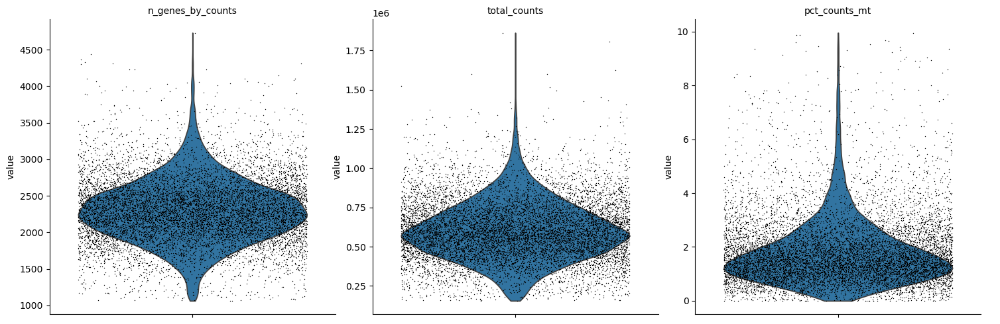

In [172]:
sc.pl.violin(
    adata, ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4, multi_panel=True)

## Filter

We start out with a very lenient filter, and use these quality statistics later to see how they affect clusters.

Note: these data come from an already published dataset, the filtering was already performed, and these steps do not make any difference.

In [173]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

## Doublets

One common occurence is that one droplet captures more than one cell. Scanpy embeds the [scrublet](https://github.com/swolock/scrublet) algorithm that predicts based on simulated doublets [<span style="color:green">(tutorial)</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#doublet-detection)

We run this by (note this may takes a while)

In [174]:
sc.pp.scrublet(adata)

Scrublet adds two extra columns to the `adata.obs` object:

In [175]:
adata.obs[['doublet_score', 'predicted_doublet']].head(3)

,doublet_score,predicted_doublet
K03FC.1A10,0.029006,False
K03FC.3A6,0.041211,False
K03FH.3B1,0.046968,False


We could filter on doublets here, but it is smarter to check clusters later.

## Normalization

We are still dealing with raw counts. We typically would:

* Correct per cell **sequencing depth** to compare cells
* Go to **log space** so we do not only look at changes in highly expressing genes

[<span style="color:green">[From the tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#normalization): 

> The next preprocessing step is normalization. A common approach is count depth scaling with subsequent log plus one (log1p) transformation. Count depth scaling normalizes the data to a “size factor” such as the median count depth in the dataset, ten thousand (CP10k) or one million (CPM, counts per million). The size factor for count depth scaling can be controlled via target_sum in pp.normalize_total. We are applying median count depth normalization with log1p transformation (AKA log1PF).

In [176]:
# Saving a copy of the raw count data into 
# adata.layers
adata.layers["counts"] = adata.X.copy()
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

---

# Dimensionality reduction & clustering

Now we have a (relatively) massive dataset:

In [177]:
adata.shape

(10801, 29025)

The most common approach is clusters all cells on their expression profile, and then study clusters (instead of cells)

This is typically done by reducing the number of dimensions (bring down 10,801 cells to a much smaller number of clusters). 

This is called **[dimensionallity reduction](https://en.wikipedia.org/wiki/Dimensionality_reduction)**. The most well known version of this is Principal Component Analysis ([PCA](https://en.wikipedia.org/wiki/Principal_component_analysis))

[<span style="color:navy">[From Wikipedia]</span>](): 
> Dimensionality reduction, or dimension reduction, is the transformation of data from a high-dimensional space into a low-dimensional space so that the low-dimensional representation retains some meaningful properties of the original data, ideally close to its intrinsic dimension. Working in high-dimensional spaces can be undesirable for many reasons; raw data are often sparse as a consequence of the curse of dimensionality, and analyzing the data is usually computationally intractable (hard to control or deal with). Dimensionality reduction is common in fields that deal with large numbers of observations and/or large numbers of variables, such as signal processing, speech recognition, neuroinformatics, and bioinformatics.[1] 

## Feature selection

The first step is to select the most informative genes. Many genes will vary little within our experiment. 

To improve power, we will remove them for subsequent analysis [<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#feature-selection): 

In [178]:
# This tags the highly variable genes.
sc.pp.highly_variable_genes(adata, n_top_genes=3000)

#and adds this to adata.var
adata.var.loc[['Cst3', 'Apoe', 'Hexb'], ['highly_variable','means','dispersions','dispersions_norm']]

,highly_variable,means,dispersions,dispersions_norm
Cst3,False,10.046235,8.396836,0.707107
Apoe,True,8.182927,10.429324,2.512982
Hexb,False,9.010912,6.830448,-1.103040


### We can plot the results

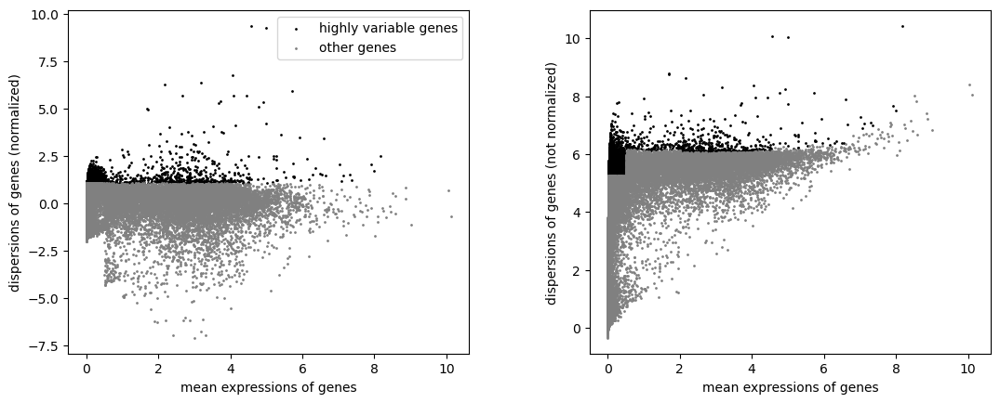

In [179]:
sc.pl.highly_variable_genes(adata)

## Principal Component Analysis

[<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#dimensionality-reduction) 

First step is to run PCA, which will predict the 50 most descriptive components

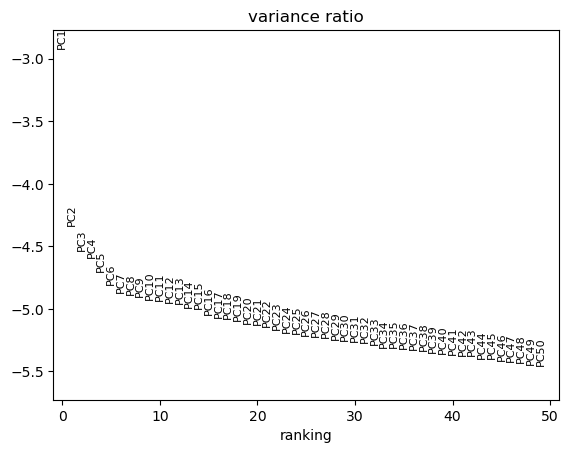

In [180]:
sc.tl.pca(adata)

# and plot explained variance per component
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

You can see that there are few components that explain a lot of observed variance (up until 7). The rest steadily drops in explained variance - at a certain moment the algorithm only shows noise.

### PLot PCA

We can now see if we already see separation by looking at the first 2 components.

<Figure size 500x300 with 0 Axes>

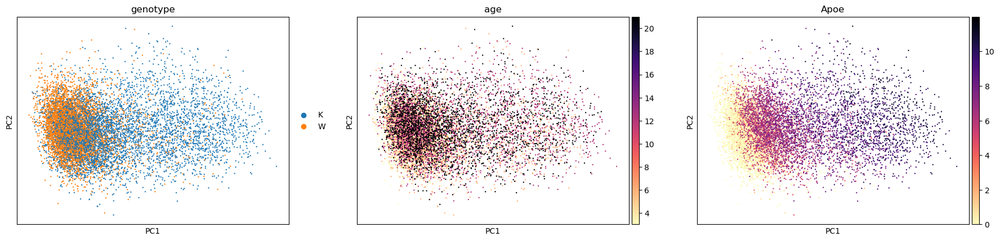

In [184]:
plt.figure(figsize=(5,3))
sc.pl.pca(adata, color=["genotype", "age", "Apoe"], cmap='magma_r')

Although we only see the first 2 components, and there is more variation to be discovered.  We do already see **separation on genotype**, and, as we expected, **Apoe is definitely up in the APP-NLGF mice**

## Neighbours & UMAP

We have 7, maybe more components now that have (possibly) relevant information on our microglia. We can only visualize 2 at a time. To further reduce dimensions we use a non linear approach which consists of two steps. Calculating a **neighbour distance graph**, followed by **UMAP** (historically also TSNE) [<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#nearest-neighbor-graph-constuction-and-visualization).

Note, a nice page to understand UMAP is: [understanding-umap](https://pair-code.github.io/understanding-umap/)

Running this will take some time.

In [185]:
sc.pp.neighbors(adata, n_pcs=7)
sc.tl.umap(adata)

Note, both of these functions have parameters. It sometimes pays of to experiment with them. Read the Scanpy API documentation:
- https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.umap.html
- https://scanpy.readthedocs.io/en/stable/api/generated/scanpy.pp.neighbors.html

### Visualizing UMAP

A UMAP wraps up multiple dimensions into two, for easy visualization.

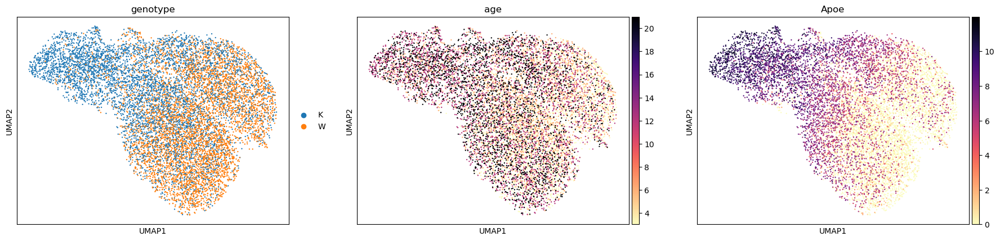

In [186]:
sc.pl.umap(adata, color=["genotype", "age", "Apoe"], cmap='magma_r')

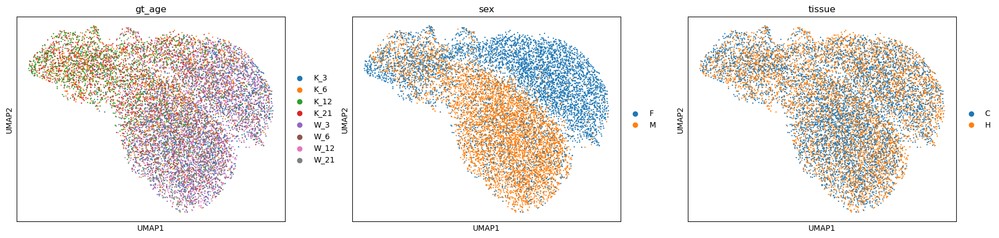

In [188]:
# making a categorical variable that combined genotype + age
adata.obs['gt_age'] = adata.obs['genotype'].astype(str) + '_' + adata.obs['age'].astype(str)
sc.pl.umap(adata, color=["gt_age", "sex", "tissue"], cmap='magma_r')

## Cluster

Last step is to assign clusters [<span style="color:green">[tutorial]</span>](https://scanpy.readthedocs.io/en/stable/tutorials/basics/clustering.html#clustering) 

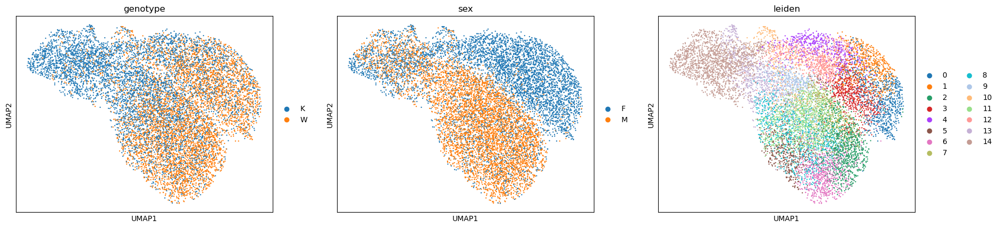

In [189]:
sc.tl.leiden(adata, flavor="igraph", n_iterations=2)
sc.pl.umap(adata, color=["genotype", "sex", "leiden"], cmap='magma_r')

---

# Differential expression, finding marker genes

---

# Continuing the analysis

---

# Closing remarks

---

# Appendix 1 - Visualize plots from the paper

In [7]:
# Load the data
import scanpy as sc
adata = sc.read_h5ad('./SalaFrigerio_finished.h5ad')

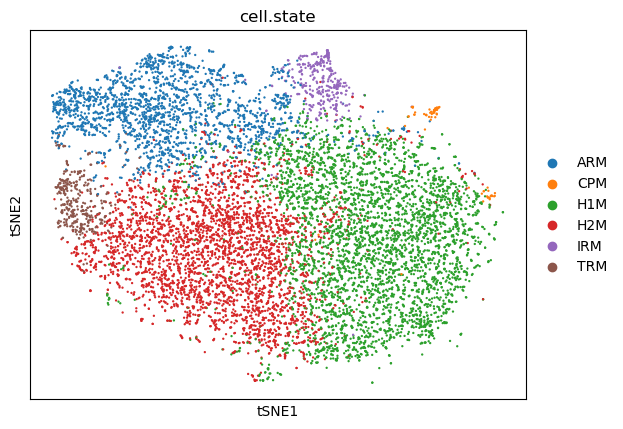

In [5]:
sc.pl.tsne(adata, color='cell.state')

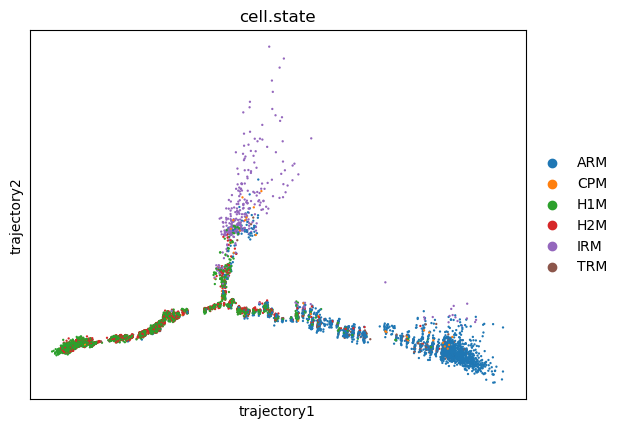

In [6]:
sc.pl.embedding(adata, basis='trajectory', color='cell.state')

---

# Appendix 2 - Background reading

## Technical

* [Jupyter lab documentation](https://jupyterlab.readthedocs.io/en/stable/)
* [Pandas documentation](https://pandas.pydata.org/)
* [Conda](https://docs.conda.io/en/latest/) & [Mamba](https://mamba.readthedocs.io/en/latest/) documentation
* [Scanpy documentation](https://scanpy.readthedocs.io/en/stable/), which is part of the [SCVerse](https://scverse.org/). A collection of tools around single cell (and spatial) analysis (in Python).
* [Seurat](https://satijalab.org/seurat/). The leading single cell framework in `R`
* [Scrublet doublet detection github](https://github.com/swolock/scrublet) and [scrublet paper](https://www.cell.com/cell-systems/fulltext/S2405-4712(18)30474-5?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS2405471218304745%3Fshowall%3Dtrue)

## General resources on single cell data analysis

* [Single cell best practices](https://www.sc-best-practices.org/preamble.html) - a great online book on single cell analysis in python.
* [Single-Cell Transcriptomics: Current Methods and Challenges in Data Acquisition and Analysis](https://www.frontiersin.org/journals/neuroscience/articles/10.3389/fnins.2021.591122/full)


## Some landmark papers with single cell transcriptomics data

* [A Unique Microglia Type Associated with Restricting Development of Alzheimer’s Disease](https://www.cell.com/fulltext/S0092-8674(17)30578-0)
* [Early Alzheimer's disease pathology in human cortex involves transient cell states](https://pubmed.ncbi.nlm.nih.gov/37774681/)
* [Integrated multimodal cell atlas of Alzheimer’s disease](https://www.biorxiv.org/content/10.1101/2023.05.08.539485v3)

## Where to find public (neuroscience releated) data?

There are many sources to get single cell data from.

- Generate yourself
- Papers
- GEO / SRA - see for example [the GEO page for our paper](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE127893)
- [Seattle AD Brain Cell atlas](https://portal.brain-map.org/explore/seattle-alzheimers-disease)
- [CelLXGene](https://cellxgene.cziscience.com/datasets)
- [Human Cell Atlas](https://data.humancellatlas.org/)
- [Allen Brain Map](https://portal.brain-map.org/)